In [1]:
# ============================================================
# 1. IMPORTS AND CONFIGURATION
# ============================================================

import os
import shutil
import pathlib
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

from google.colab import drive

from tensorflow.keras import layers, models
# UPDATED: InceptionResNetV2 import
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau,
    ModelCheckpoint
)

from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    precision_recall_fscore_support,
    accuracy_score,
    roc_curve,
    auc
)

from sklearn.preprocessing import label_binarize

from scipy.stats import wilcoxon
from statsmodels.stats.contingency_tables import mcnemar

import seaborn as sns


# ============================================================
# 2. GOOGLE DRIVE
# ============================================================

drive.mount('/content/drive')


# ============================================================
# 3. GPU AND MIXED PRECISION
# ============================================================

gpus = tf.config.list_physical_devices('GPU')

if gpus:
    print("GPU detected:", gpus)
    tf.keras.mixed_precision.set_global_policy('mixed_float16')
    print("Mixed precision enabled")
else:
    print("WARNING: GPU not detected. Training will be slow.")


# ============================================================
# 4. CONFIGURATION
# ============================================================

IMG_SIZE = 299  # InceptionResNetV2 ke liye optimal resolution
BATCH_SIZE = 32
SEED = 42

BASE_PHASE1_EPOCHS = 10
BASE_PHASE2_EPOCHS = 25

MAMBA_PHASE1_EPOCHS = 10
MAMBA_PHASE2_EPOCHS = 25

TRAIN_RATIO = 0.70
VAL_RATIO = 0.10
TEST_RATIO = 0.20

DRIVE_DATA_PATH = '/content/drive/MyDrive/cotton_weed_merged'
LOCAL_DATA_PATH = '/content/cotton_weed_local'

# UPDATED: Model save paths renamed
BASE_SAVE_PATH = '/content/drive/MyDrive/InceptionResNetV2_Cotton.keras'
MAMBA_SAVE_PATH = '/content/drive/MyDrive/Model/InceptionResNetV2_Cotton_Mamba.keras'

os.makedirs(os.path.dirname(MAMBA_SAVE_PATH), exist_ok=True)


# ============================================================
# 5. COPY DATASET TO COLAB LOCAL STORAGE
# ============================================================

if not os.path.exists(LOCAL_DATA_PATH):
    print("Copying cotton dataset to local Colab storage...")
    shutil.copytree(DRIVE_DATA_PATH, LOCAL_DATA_PATH)
    print("Cotton dataset copied successfully.")
else:
    print("Local cotton dataset already exists.")

base_data_path = LOCAL_DATA_PATH


# ============================================================
# 6-7. STRATIFIED TRAIN/VAL/TEST SPLIT (FILE-LEVEL, NOT BATCH-LEVEL)
# ============================================================

IMG_EXTENSIONS = {'.jpg', '.jpeg', '.png', '.bmp', '.webp', '.tmp'}

data_dir = pathlib.Path(base_data_path)
class_names = sorted([d.name for d in data_dir.iterdir() if d.is_dir()])
num_classes = len(class_names)

print("\nClasses:", class_names)
print("Number of classes:", num_classes)

train_files, val_files, test_files = [], [], []
train_labels, val_labels, test_labels = [], [], []

rng = np.random.default_rng(SEED)

for idx, cls in enumerate(class_names):
    cls_dir = data_dir / cls
    files = sorted([
        str(p) for p in cls_dir.iterdir()
        if p.suffix.lower() in IMG_EXTENSIONS
    ])
    files = np.array(files)
    rng.shuffle(files)

    n = len(files)
    n_train = int(n * TRAIN_RATIO)
    n_val = int(n * VAL_RATIO)
    n_test = n - n_train - n_val

    train_files.extend(files[:n_train]);                train_labels.extend([idx] * n_train)
    val_files.extend(files[n_train:n_train + n_val]);     val_labels.extend([idx] * n_val)
    test_files.extend(files[n_train + n_val:]);           test_labels.extend([idx] * n_test)

train_files = np.array(train_files); train_labels = np.array(train_labels)
val_files = np.array(val_files);     val_labels = np.array(val_labels)
test_files = np.array(test_files);   test_labels = np.array(test_labels)

print("\nDataset split (file-level, stratified per class):")
print("Train images:", len(train_files))
print("Validation images:", len(val_files))
print("Test images:", len(test_files))

steps_per_epoch_train = max(1, len(train_files) // BATCH_SIZE)


def load_and_preprocess(path, label):
    img = tf.io.read_file(path)
    img = tf.image.decode_image(img, channels=3, expand_animations=False)
    img = tf.image.resize(img, (IMG_SIZE, IMG_SIZE))
    img.set_shape((IMG_SIZE, IMG_SIZE, 3))
    return img, label

def make_dataset(files, labels, training=False):
    ds = tf.data.Dataset.from_tensor_slices((files, labels))
    if training:
        ds = ds.shuffle(buffer_size=len(files), seed=SEED, reshuffle_each_iteration=True)
    ds = ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.batch(BATCH_SIZE)
    return ds

train_ds = make_dataset(train_files, train_labels, training=True)
val_ds = make_dataset(val_files, val_labels)
test_ds = make_dataset(test_files, test_labels)


# ========= STRATIFIED SPLIT TABLE ===========

def count_images_per_class(data_path):
    class_counts = {}
    for class_name in sorted(os.listdir(data_path)):
        class_dir = os.path.join(data_path, class_name)
        if not os.path.isdir(class_dir):
            continue
        count = sum(
            1 for f in os.listdir(class_dir)
            if os.path.splitext(f)[1].lower() in IMG_EXTENSIONS
        )
        class_counts[class_name] = count
    return class_counts


def compute_split_counts(class_counts, train_ratio, val_ratio, test_ratio):
    split_rows = []
    for class_name, total in class_counts.items():
        train_n = int(total * train_ratio)
        val_n = int(total * val_ratio)
        test_n = total - train_n - val_n
        split_rows.append((class_name, train_n, val_n, test_n, total))
    return split_rows


def print_stratified_report(split_rows):
    total_train = sum(r[1] for r in split_rows)
    total_val = sum(r[2] for r in split_rows)
    total_test = sum(r[3] for r in split_rows)
    total_all = sum(r[4] for r in split_rows)
    n_cls = len(split_rows)

    avg_train = total_train / n_cls if n_cls else 0
    avg_val = total_val / n_cls if n_cls else 0
    avg_test = total_test / n_cls if n_cls else 0

    print("PERFECTLY STRATIFIED DISTRIBUTION")
    print("=" * 60)
    print(f"Training Images   : {total_train:<6} ({avg_train:.1f} per class)")
    print(f"Validation Images : {total_val:<6} ({avg_val:.1f} per class)")
    print(f"Testing Images    : {total_test:<6} ({avg_test:.1f} per class)")
    print(f"Total Images      : {total_all} / {total_all}")
    print()
    print("=" * 78)
    print("CLASS-WISE IMAGE DISTRIBUTION")
    print("=" * 78)

    name_width = max(len(r[0]) for r in split_rows) + 2
    name_width = max(name_width, len("Class") + 2)

    header = (
        f"{'Class':<{name_width}}{'Train':>8}{'Validation':>13}"
        f"{'Test':>8}{'Total':>8}"
    )
    print(header)
    print("-" * len(header))

    for class_name, train_n, val_n, test_n, total in split_rows:
        print(
            f"{class_name:<{name_width}}{train_n:>8}{val_n:>13}"
            f"{test_n:>8}{total:>8}"
        )

    print("-" * len(header))
    print(
        f"{'TOTAL':<{name_width}}{total_train:>8}{total_val:>13}"
        f"{total_test:>8}{total_all:>8}"
    )
    print("=" * 78)


class_counts = count_images_per_class(base_data_path)
split_rows = compute_split_counts(class_counts, TRAIN_RATIO, VAL_RATIO, TEST_RATIO)
print_stratified_report(split_rows)


Mounted at /content/drive
GPU detected: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Mixed precision enabled
Copying cotton dataset to local Colab storage...
Cotton dataset copied successfully.

Classes: ['Amaranthus viridis', 'Carpetweeds', 'Cleome gynandra', 'Commelina benghalensis', 'Cynodon dactylon', 'Echinochloa colona', 'Morningglory', 'Nutsedge', 'PalmerAmaranth', 'Phyllanthus urinaria', 'Purslane', 'Trianthema portulacastrum', 'cotton']
Number of classes: 13

Dataset split (file-level, stratified per class):
Train images: 4550
Validation images: 650
Test images: 1300
PERFECTLY STRATIFIED DISTRIBUTION
Training Images   : 4550   (350.0 per class)
Validation Images : 650    (50.0 per class)
Testing Images    : 1300   (100.0 per class)
Total Images      : 6500 / 6500

CLASS-WISE IMAGE DISTRIBUTION
Class                         Train   Validation    Test   Total
----------------------------------------------------------------
Amaranthus viridis              35

In [2]:
# ============================================================
# 8. DATA AUGMENTATION (STRENGTHENED)
# ============================================================

from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input

data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomRotation(0.15),
    layers.RandomZoom(0.15),
    layers.RandomContrast(0.10),
    layers.RandomBrightness(0.10),
], name="data_augmentation")

# Augment first on [0, 255] -> Then apply InceptionResNetV2 preprocess_input
train_ds = train_ds.map(
    lambda x, y: (preprocess_input(data_augmentation(x, training=True)), y),
    num_parallel_calls=tf.data.AUTOTUNE
)

val_ds = val_ds.map(
    lambda x, y: (preprocess_input(x), y),
    num_parallel_calls=tf.data.AUTOTUNE
)

test_ds = test_ds.map(
    lambda x, y: (preprocess_input(x), y),
    num_parallel_calls=tf.data.AUTOTUNE
)

train_ds = train_ds.prefetch(tf.data.AUTOTUNE)
val_ds = val_ds.prefetch(tf.data.AUTOTUNE)
test_ds = test_ds.prefetch(tf.data.AUTOTUNE)

print("Dataset pipeline ready for InceptionResNetV2.")


# ============================================================
# 9. COMMON CALLBACKS
# ============================================================

def get_callbacks(save_path, patience=8):
    return [
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=3,
            min_lr=1e-8,
            verbose=1
        ),

        EarlyStopping(
            monitor='val_loss',
            patience=patience,
            restore_best_weights=True,
            verbose=1
        ),

        ModelCheckpoint(
            save_path,
            monitor='val_accuracy',
            save_best_only=True,
            verbose=1
        )
    ]


def get_callbacks_cosine(save_path, patience=8):
    return [
        EarlyStopping(
            monitor='val_loss',
            patience=patience,
            restore_best_weights=True,
            verbose=1
        ),

        ModelCheckpoint(
            save_path,
            monitor='val_accuracy',
            save_best_only=True,
            verbose=1
        )
    ]


# ============================================================
# 10. BUILD BASE InceptionResNetV2 MODEL
# ============================================================

from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2

print("\nBuilding InceptionResNetV2 baseline...")

base_model = InceptionResNetV2(
    include_top=False,
    weights='imagenet',
    input_shape=(IMG_SIZE, IMG_SIZE, 3)
)
base_model.trainable = False

inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
x = base_model(inputs, training=False)

x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.3)(x)

outputs = layers.Dense(num_classes, activation='softmax', dtype='float32')(x)

model_base = models.Model(inputs, outputs, name='InceptionResNetV2_Base')


# ============================================================
# 11. BASE MODEL - PHASE 1
# ============================================================

model_base.compile(
    optimizer=tf.keras.optimizers.Adam(
        learning_rate=5e-4
    ),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

print("\nBASE MODEL - PHASE 1")

base_history_phase1 = model_base.fit(
    train_ds,
    validation_data=val_ds,
    epochs=BASE_PHASE1_EPOCHS
)


# ============================================================
# 12. BASE MODEL - PHASE 2 FINE-TUNING (DEEPER + COSINE LR)
# ============================================================

base_model.trainable = True

# InceptionResNetV2 around 780 layers ki deep architecture hai,
# isliye last 60 layers unfreeze karna optimal feature adaptation deta hai.
FINE_TUNE_AT = len(base_model.layers) - 60
for layer in base_model.layers[:FINE_TUNE_AT]:
    layer.trainable = False

base_lr_schedule = tf.keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=2e-5,
    decay_steps=BASE_PHASE2_EPOCHS * steps_per_epoch_train
)

model_base.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=base_lr_schedule),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

print("\nBASE MODEL - PHASE 2 FINE-TUNING")

base_history_phase2 = model_base.fit(
    train_ds,
    validation_data=val_ds,
    epochs=BASE_PHASE2_EPOCHS,
    callbacks=get_callbacks_cosine(BASE_SAVE_PATH, patience=8)
)


# ============================================================
# 13. LOAD BEST BASE MODEL
# ============================================================

model_base = tf.keras.models.load_model(
    BASE_SAVE_PATH
)

base_loss, base_acc = model_base.evaluate(
    test_ds,
    verbose=0
)

print(
    f"\nBase InceptionResNetV2 Accuracy: "
    f"{base_acc * 100:.2f}%"
)


Dataset pipeline ready for InceptionResNetV2.

Building InceptionResNetV2 baseline...
219055592/219055592 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

BASE MODEL - PHASE 1
Epoch 1/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 238s 1s/step - accuracy: 0.5444 - loss: 1.4768 - val_accuracy: 0.6954 - val_loss: 0.8938
Epoch 2/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 144s 1s/step - accuracy: 0.7090 - loss: 0.9073 - val_accuracy: 0.7538 - val_loss: 0.7385
Epoch 3/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 203s 1s/step - accuracy: 0.7422 - loss: 0.7727 - val_accuracy: 0.7708 - val_loss: 0.6706
Epoch 4/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 146s 1s/step - accuracy: 0.7527 - loss: 0.7488 - val_accuracy: 0.7877 - val_loss: 0.6117
Epoch 5/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 201s 1s/step - accuracy: 0.7813 - loss: 0.6736 - val_accuracy: 0.8308 - val_loss: 0.4671
Epoch 6/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 146s 1s/step - accuracy: 0.7886 - loss: 0.6441 - val_accuracy: 0.8385 - val_loss: 0.4562
Epoch 7/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 146s 1s/step - accuracy: 


Building InceptionResNetV2 + Vision Mamba...

MAMBA MODEL - PHASE 1
Epoch 1/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.3696 - loss: 2.4107   
Epoch 1: val_accuracy improved from None to 0.70769, saving model to /content/drive/MyDrive/Model/InceptionResNetV2_Cotton_Mamba.keras

Epoch 1: finished saving model to /content/drive/MyDrive/Model/InceptionResNetV2_Cotton_Mamba.keras
143/143 ━━━━━━━━━━━━━━━━━━━━ 253s 1s/step - accuracy: 0.5051 - loss: 1.7685 - val_accuracy: 0.7077 - val_loss: 1.0076
Epoch 2/10
142/143 ━━━━━━━━━━━━━━━━━━━━ 0s 994ms/step - accuracy: 0.6614 - loss: 1.0882
Epoch 2: val_accuracy improved from 0.70769 to 0.78308, saving model to /content/drive/MyDrive/Model/InceptionResNetV2_Cotton_Mamba.keras

Epoch 2: finished saving model to /content/drive/MyDrive/Model/InceptionResNetV2_Cotton_Mamba.keras
143/143 ━━━━━━━━━━━━━━━━━━━━ 152s 1s/step - accuracy: 0.6697 - loss: 1.0855 - val_accuracy: 0.7831 - val_loss: 0.6206
Epoch 3/10
142/143 ━━━━━━━━━━━━━━━━━━━━ 1s 1

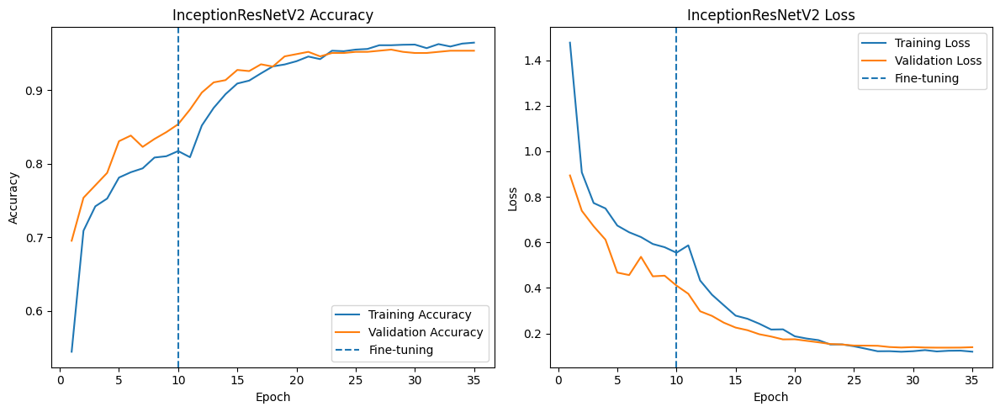

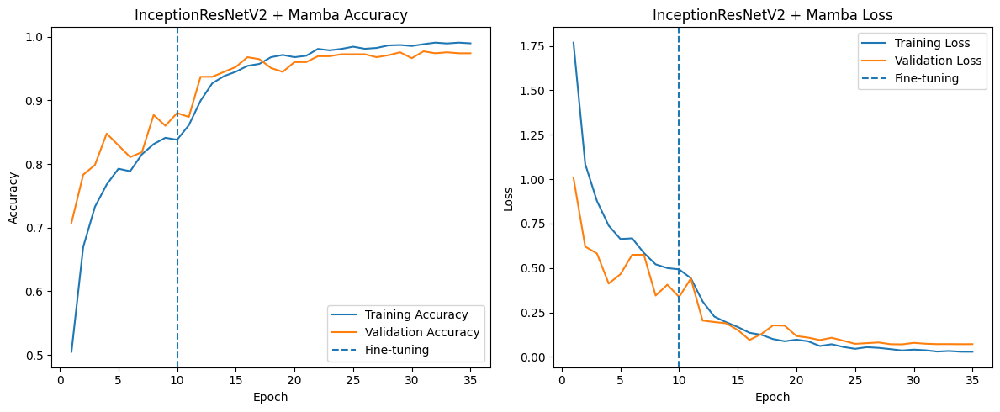

In [3]:
import keras
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2

# ============================================================
# 14. VISION MAMBA BLOCK (BOTTLENECK OPTIMIZED FOR INCEPTIONRESNETV2)
# ============================================================

@keras.saving.register_keras_serializable(package="custom", name="LayerScale")
class LayerScale(layers.Layer):
    def __init__(self, channels, init_value=1e-2, **kwargs):
        super().__init__(**kwargs)
        self.channels = channels
        self.init_value = init_value

    def build(self, input_shape):
        self.gamma = self.add_weight(
            shape=(self.channels,),
            initializer=tf.keras.initializers.Constant(self.init_value),
            trainable=True,
            name="gamma"
        )

    def call(self, inputs):
        return inputs * self.gamma

    def get_config(self):
        config = super().get_config()
        config.update({
            "channels": self.channels,
            "init_value": self.init_value
        })
        return config


def vision_mamba_block(x, name_prefix="vmamba"):
    H, W, C = x.shape[1], x.shape[2], x.shape[3]
    bottleneck_dim = max(128, C // 4)  # Dynamic scaling for 1536 channels

    # Local spatial branch
    branch1 = layers.DepthwiseConv2D(kernel_size=3, padding='same')(x)
    branch1 = layers.Activation('swish')(branch1)
    branch1 = layers.Reshape((H * W, C))(branch1)

    # Gating branch with Bottleneck
    seq = layers.Reshape((H * W, C))(x)
    branch2 = layers.Dense(bottleneck_dim, activation='swish')(seq)
    branch2 = layers.Dense(C, activation='swish')(branch2)

    # Gated feature interaction
    gated = layers.Multiply()([branch1, branch2])
    gated = layers.Dense(C)(gated)

    out = layers.Reshape((H, W, C))(gated)
    out = LayerScale(C, init_value=1e-2, name=f"{name_prefix}_layerscale_apply")(out)

    return layers.Add()([x, out])


# ============================================================
# 15. BUILD INCEPTIONRESNETV2 + MAMBA MODEL
# ============================================================

print("\nBuilding InceptionResNetV2 + Vision Mamba...")

mamba_backbone = InceptionResNetV2(
    include_top=False,
    weights='imagenet',
    input_shape=(IMG_SIZE, IMG_SIZE, 3)
)

mamba_backbone.trainable = False

mamba_inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))

x = mamba_backbone(mamba_inputs, training=False)
x = vision_mamba_block(x, name_prefix="vmamba")

x = layers.GlobalAveragePooling2D()(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.4)(x)

x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.4)(x)

mamba_outputs = layers.Dense(
    num_classes,
    activation='softmax',
    dtype='float32'
)(x)

model_mamba = models.Model(
    mamba_inputs,
    mamba_outputs,
    name='InceptionResNetV2_Mamba'
)


# ============================================================
# 16. MAMBA MODEL - PHASE 1
# ============================================================

model_mamba.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=5e-4),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

print("\nMAMBA MODEL - PHASE 1")

mamba_history_phase1 = model_mamba.fit(
    train_ds,
    validation_data=val_ds,
    epochs=MAMBA_PHASE1_EPOCHS,
    callbacks=get_callbacks_cosine(MAMBA_SAVE_PATH, patience=8)
)


# ============================================================
# 17. MAMBA MODEL - PHASE 2 FINE-TUNING
# ============================================================

mamba_backbone.trainable = True

# InceptionResNetV2 deep structure ke hisab se last 80 layers unfreeze ki hain
FINE_TUNE_AT_MAMBA = len(mamba_backbone.layers) - 80

for layer in mamba_backbone.layers[:FINE_TUNE_AT_MAMBA]:
    layer.trainable = False

for layer in mamba_backbone.layers[FINE_TUNE_AT_MAMBA:]:
    if isinstance(layer, layers.BatchNormalization):
        layer.trainable = False  # Keep BN stats frozen for numerical stability

mamba_lr_schedule = tf.keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=1e-4,
    decay_steps=MAMBA_PHASE2_EPOCHS * steps_per_epoch_train
)

model_mamba.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=mamba_lr_schedule),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

print("\nMAMBA MODEL - PHASE 2")

mamba_history_phase2 = model_mamba.fit(
    train_ds,
    validation_data=val_ds,
    epochs=MAMBA_PHASE2_EPOCHS,
    callbacks=get_callbacks_cosine(MAMBA_SAVE_PATH, patience=8)
)


# ============================================================
# 18. LOAD BEST MAMBA MODEL
# ============================================================

model_mamba = tf.keras.models.load_model(
    MAMBA_SAVE_PATH,
    custom_objects={'LayerScale': LayerScale},
    safe_mode=False
)

mamba_loss, mamba_acc = model_mamba.evaluate(test_ds, verbose=0)

print(f"\nInceptionResNetV2 + Mamba Accuracy: {mamba_acc * 100:.2f}%")


# ============================================================
# 19. FINAL MODEL COMPARISON
# ============================================================

print("\n" + "=" * 60)
print("FINAL MODEL COMPARISON")
print("=" * 60)

print(
    f"InceptionResNetV2      : "
    f"{base_acc * 100:.2f}%"
)

print(
    f"InceptionResNetV2+Mamba: "
    f"{mamba_acc * 100:.2f}%"
)

if mamba_acc > base_acc:
    print("\nBEST MODEL: InceptionResNetV2 + Mamba")
elif base_acc > mamba_acc:
    print("\nBEST MODEL: InceptionResNetV2")
else:
    print("\nBoth models have equal accuracy.")


# ============================================================
# 20. TRAINING HISTORY PLOTS
# ============================================================

def plot_history(history1, history2, phase1_epochs, title):
    acc = history1.history['accuracy'] + history2.history['accuracy']
    val_acc = history1.history['val_accuracy'] + history2.history['val_accuracy']
    loss = history1.history['loss'] + history2.history['loss']
    val_loss = history1.history['val_loss'] + history2.history['val_loss']

    epochs = range(1, len(acc) + 1)

    fig = plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, label='Training Accuracy')
    plt.plot(epochs, val_acc, label='Validation Accuracy')
    plt.axvline(phase1_epochs, linestyle='--', label='Fine-tuning')
    plt.xlabel('Epoch'); plt.ylabel('Accuracy')
    plt.title(f'{title} Accuracy'); plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, label='Training Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.axvline(phase1_epochs, linestyle='--', label='Fine-tuning')
    plt.xlabel('Epoch'); plt.ylabel('Loss')
    plt.title(f'{title} Loss'); plt.legend()

    plt.tight_layout()
    plt.show()
    plt.close(fig)


plot_history(base_history_phase1, base_history_phase2,
             BASE_PHASE1_EPOCHS, 'InceptionResNetV2')

plot_history(mamba_history_phase1, mamba_history_phase2,
             MAMBA_PHASE1_EPOCHS, 'InceptionResNetV2 + Mamba')


In [4]:
import os
import tensorflow as tf

# 1. InceptionResNetV2 ke sahi paths yahan set karein
BASE_SAVE_PATH = '/content/drive/MyDrive/InceptionResNetV2_Cotton.keras'
MAMBA_SAVE_PATH = '/content/drive/MyDrive/Model/InceptionResNetV2_Cotton_Mamba.keras'

# 2. Mixed Precision Policy float32 par switch karein (Evaluation precision issues se bachne ke liye)
tf.keras.mixed_precision.set_global_policy('float32')

# 3. Disk file ho toh wahan se, nahi toh direct RAM models use karein
if os.path.exists(BASE_SAVE_PATH):
    model_base_fp32 = tf.keras.models.load_model(BASE_SAVE_PATH)
    print("✅ InceptionResNetV2 Base model disk se load ho gaya.")
else:
    model_base_fp32 = model_base
    print("⚠️ Path par file nahi mili, RAM me majood 'model_base' (InceptionResNetV2) use ho raha hai.")

if os.path.exists(MAMBA_SAVE_PATH):
    model_mamba_fp32 = tf.keras.models.load_model(
        MAMBA_SAVE_PATH,
        custom_objects={'LayerScale': LayerScale},
        safe_mode=False
    )
    print("✅ InceptionResNetV2+Mamba model disk se load ho gaya.")
else:
    model_mamba_fp32 = model_mamba
    print("⚠️ Path par file nahi mili, RAM me majood 'model_mamba' (InceptionResNetV2) use ho raha hai.")


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adam', because it has 89 variables whereas the saved optimizer has 93 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


✅ InceptionResNetV2 Base model disk se load ho gaya.
✅ InceptionResNetV2+Mamba model disk se load ho gaya.


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adam', because it has 91 variables whereas the saved optimizer has 95 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [5]:
import os
import tensorflow as tf
from google.colab import drive

# 1. Drive mount check
if not os.path.exists('/content/drive'):
    drive.mount('/content/drive')

# 2. Custom Layer (LayerScale) define aur register karein
@tf.keras.utils.register_keras_serializable(package="custom")
class LayerScale(tf.keras.layers.Layer):
    def __init__(self, channels, init_value=1e-2, **kwargs):
        super().__init__(**kwargs)
        self.channels = channels
        self.init_value = init_value

    def build(self, input_shape):
        self.gamma = self.add_weight(
            name="gamma",
            shape=(self.channels,),
            initializer=tf.keras.initializers.Constant(self.init_value),
            trainable=True,
        )
        super().build(input_shape)

    def call(self, inputs):
        return inputs * self.gamma

    def get_config(self):
        config = super().get_config()
        config.update({
            "channels": self.channels,
            "init_value": self.init_value,
        })
        return config

# 3. Save paths (UPDATED to InceptionResNetV2)
BASE_SAVE_PATH = '/content/drive/MyDrive/InceptionResNetV2_Cotton.keras'
MAMBA_SAVE_PATH = '/content/drive/MyDrive/Model/InceptionResNetV2_Cotton_Mamba.keras'

# 4. Models restore karein (custom_objects pass karke)
print("Loading saved InceptionResNetV2 models from Drive...")
model_base = tf.keras.models.load_model(BASE_SAVE_PATH)
model_mamba = tf.keras.models.load_model(
    MAMBA_SAVE_PATH,
    custom_objects={'LayerScale': LayerScale},
    safe_mode=False
)

print("✅ Dono InceptionResNetV2 models successfully load ho gaye hain! Ab aapka evaluation cell bina error ke chalega.")


Loading saved InceptionResNetV2 models from Drive...
✅ Dono InceptionResNetV2 models successfully load ho gaye hain! Ab aapka evaluation cell bina error ke chalega.


Drive se trained InceptionResNetV2 models load ho rahe hain...
✅ InceptionResNetV2 Models Memory mein load ho gaye!

InceptionResNetV2 + MAMBA CLASSIFICATION REPORT
                           precision    recall  f1-score   support

       Amaranthus viridis     0.9604    0.9700    0.9652       100
              Carpetweeds     0.9604    0.9700    0.9652       100
          Cleome gynandra     0.9899    0.9800    0.9849       100
   Commelina benghalensis     1.0000    0.9900    0.9950       100
         Cynodon dactylon     0.9500    0.9500    0.9500       100
       Echinochloa colona     0.9029    0.9300    0.9163       100
             Morningglory     0.9901    1.0000    0.9950       100
                 Nutsedge     0.9604    0.9700    0.9652       100
           PalmerAmaranth     0.9703    0.9800    0.9751       100
     Phyllanthus urinaria     1.0000    0.9900    0.9950       100
                 Purslane     1.0000    0.9600    0.9796       100
Trianthema portulacastrum     

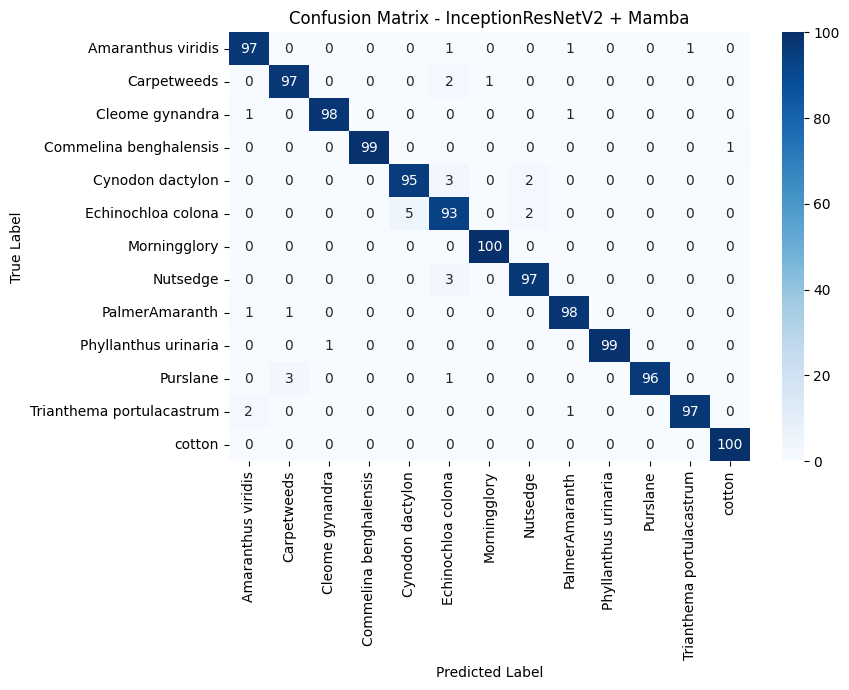

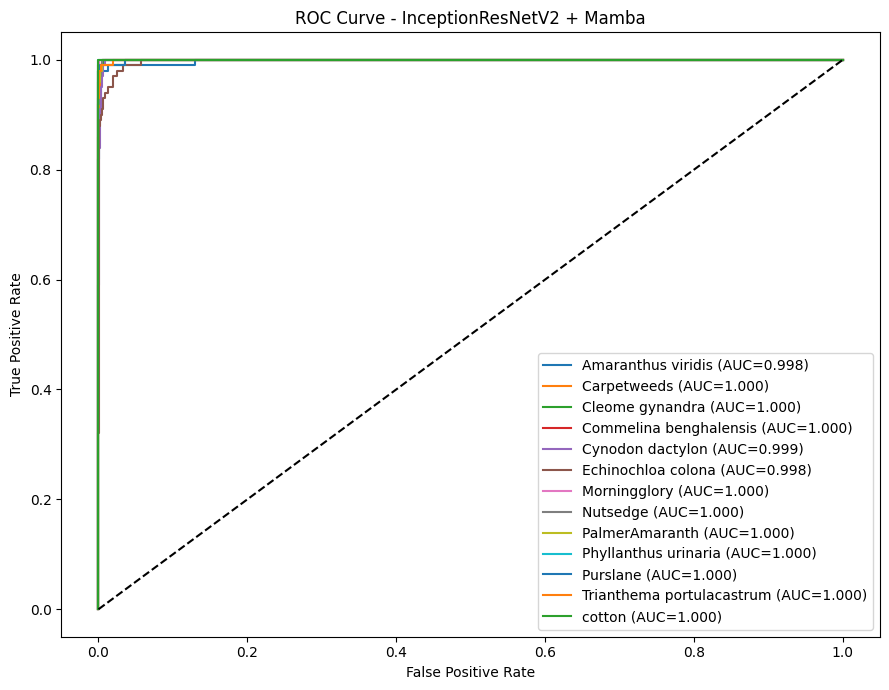


Running Grad-CAM Gallery...


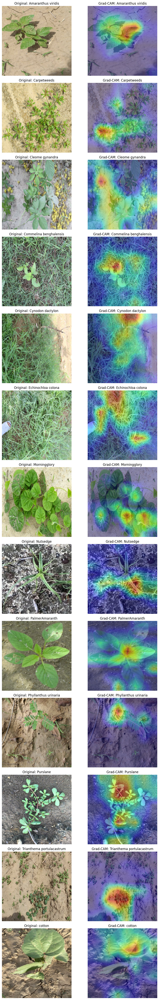

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 9.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done

Running LIME Gallery...


  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

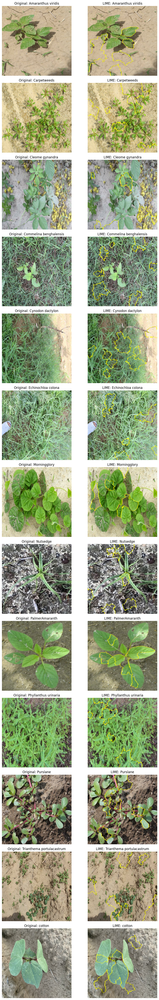

In [6]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    classification_report, precision_recall_fscore_support,
    accuracy_score, confusion_matrix, roc_curve, auc
)
from sklearn.preprocessing import label_binarize
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input

# ============================================================
# 1. FLOAT32 & CUSTOM LAYER REGISTRATION
# ============================================================

tf.keras.mixed_precision.set_global_policy('float32')

@tf.keras.utils.register_keras_serializable(package="custom")
class LayerScale(tf.keras.layers.Layer):
    def __init__(self, channels, init_value=1e-2, **kwargs):
        super().__init__(**kwargs)
        self.channels = channels
        self.init_value = init_value

    def build(self, input_shape):
        self.gamma = self.add_weight(
            name="gamma",
            shape=(self.channels,),
            initializer=tf.keras.initializers.Constant(self.init_value),
            trainable=True,
        )
        super().build(input_shape)

    def call(self, inputs):
        return inputs * self.gamma

    def get_config(self):
        config = super().get_config()
        config.update({
            "channels": self.channels,
            "init_value": self.init_value,
        })
        return config


# ============================================================
# 2. DRIVE MOUNT & MODEL LOADING (NO RETRAINING)
# ============================================================

if not os.path.exists('/content/drive'):
    from google.colab import drive
    drive.mount('/content/drive')

BASE_SAVE_PATH = '/content/drive/MyDrive/InceptionResNetV2_Cotton.keras'
MAMBA_SAVE_PATH = '/content/drive/MyDrive/Model/InceptionResNetV2_Cotton_Mamba.keras'

print("Drive se trained InceptionResNetV2 models load ho rahe hain...")
model_base = tf.keras.models.load_model(BASE_SAVE_PATH)
model_mamba = tf.keras.models.load_model(
    MAMBA_SAVE_PATH,
    custom_objects={'LayerScale': LayerScale},
    safe_mode=False
)
print("✅ InceptionResNetV2 Models Memory mein load ho gaye!")

IMG_SIZE = 299


# ============================================================
# 3. GET TEST PREDICTIONS
# ============================================================

test_ds_eval = make_dataset(test_files, test_labels)
test_ds_eval = test_ds_eval.map(
    lambda x, y: (preprocess_input(tf.image.resize(x, (IMG_SIZE, IMG_SIZE))), y),
    num_parallel_calls=tf.data.AUTOTUNE
).prefetch(tf.data.AUTOTUNE)

def get_all_predictions(models_dict, dataset):
    y_true = []
    y_prob = {name: [] for name in models_dict}

    for images, labels in dataset:
        y_true.extend(labels.numpy())
        for name, mdl in models_dict.items():
            probs = mdl(images, training=False).numpy()
            y_prob[name].extend(probs)

    y_true = np.array(y_true)

    results = {}
    for name in models_dict:
        probs_arr = np.array(y_prob[name])
        preds_arr = np.argmax(probs_arr, axis=1)
        results[name] = {"y_pred": preds_arr, "y_prob": probs_arr}

    return y_true, results

y_true, preds = get_all_predictions(
    {"base": model_base, "mamba": model_mamba}, test_ds_eval
)

y_pred_base, y_prob_base = preds["base"]["y_pred"], preds["base"]["y_prob"]
y_pred_mamba, y_prob_mamba = preds["mamba"]["y_pred"], preds["mamba"]["y_prob"]


# ============================================================
# 4. METRICS & REPORTS
# ============================================================

print("\n" + "=" * 60)
print("InceptionResNetV2 + MAMBA CLASSIFICATION REPORT")
print("=" * 60)
print(classification_report(y_true, y_pred_mamba, target_names=class_names, digits=4))

print("\n" + "=" * 60)
print("InceptionResNetV2 BASELINE CLASSIFICATION REPORT")
print("=" * 60)
print(classification_report(y_true, y_pred_base, target_names=class_names, digits=4))

metrics_base = precision_recall_fscore_support(
    y_true, y_pred_base, average='weighted', zero_division=0
)
metrics_mamba = precision_recall_fscore_support(
    y_true, y_pred_mamba, average='weighted', zero_division=0
)

print("\n" + "=" * 60)
print("OVERALL PERFORMANCE")
print("=" * 60)
print("Model                      Accuracy   Precision   Recall   F1")
print(f"InceptionResNetV2       {accuracy_score(y_true, y_pred_base):.4f}     "
      f"{metrics_base[0]:.4f}      {metrics_base[1]:.4f}    {metrics_base[2]:.4f}")
print(f"InceptionResNetV2+Mamba {accuracy_score(y_true, y_pred_mamba):.4f}     "
      f"{metrics_mamba[0]:.4f}      {metrics_mamba[1]:.4f}    {metrics_mamba[2]:.4f}")


# ============================================================
# 5. CONFUSION MATRIX & ROC-AUC PLOTS
# ============================================================

cm = confusion_matrix(y_true, y_pred_mamba)
fig = plt.figure(figsize=(9, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix - InceptionResNetV2 + Mamba')
plt.tight_layout()
plt.show()
plt.close(fig)

fig = plt.figure(figsize=(9, 7))
if num_classes == 2:
    fpr, tpr, _ = roc_curve(y_true, y_prob_mamba[:, 1])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_names[1]} (AUC={roc_auc:.3f})')
else:
    y_true_bin = label_binarize(y_true, classes=range(num_classes))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_prob_mamba[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'{class_names[i]} (AUC={roc_auc:.3f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - InceptionResNetV2 + Mamba')
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()
plt.close(fig)


# ============================================================
# 6. KERAS 3 BULLETPROOF GRAD-CAM (LAYER HOOKING METHOD)
# ============================================================

def make_gradcam_heatmap_hook(img_array, model):
    target_layer = None
    for layer in reversed(model.layers):
        try:
            shape = layer.output_shape
            if isinstance(shape, list): shape = shape[0]
            if len(shape) == 4 and 'input' not in layer.name:
                target_layer = layer
                break
        except Exception:
            continue

    if target_layer is None:
        return None, False

    captured_output = []
    original_call = target_layer.call

    def hook_call(*args, **kwargs):
        out = original_call(*args, **kwargs)
        captured_output.append(out)
        return out

    target_layer.call = hook_call

    try:
        img_cast = tf.cast(img_array, tf.float32)
        with tf.GradientTape() as tape:
            preds = model(img_cast, training=False)
            if isinstance(preds, list): preds = preds[0]
            pred_index = tf.argmax(preds[0])
            class_score = preds[:, pred_index]

        if not captured_output:
            target_layer.call = original_call
            return None, False

        conv_output = captured_output[0]
        grads = tape.gradient(class_score, conv_output)

        target_layer.call = original_call

        if grads is None:
            return None, False

        pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
        conv_out_0 = conv_output[0]

        heatmap = conv_out_0 @ pooled_grads[..., tf.newaxis]
        heatmap = tf.squeeze(heatmap)
        heatmap = tf.maximum(heatmap, 0)

        max_val = tf.reduce_max(heatmap)
        if max_val > 0:
            heatmap = heatmap / (max_val + 1e-10)
            return heatmap.numpy(), True
        return None, False

    except Exception as e:
        target_layer.call = original_call
        return None, False


def run_gradcam_gallery(model, dataset, class_names, num_classes, title):
    found_classes = set()
    fig = plt.figure(figsize=(10, 4 * num_classes))
    plot_index = 1

    for images, labels in dataset:
        for i in range(len(labels)):
            class_id = int(labels[i].numpy())
            if class_id in found_classes:
                continue

            img = images[i]
            heatmap, ok = make_gradcam_heatmap_hook(
                tf.expand_dims(img, axis=0), model
            )

            if not ok:
                continue

            found_classes.add(class_id)

            heatmap_resized = tf.image.resize(
                heatmap[..., np.newaxis], (IMG_SIZE, IMG_SIZE)
            ).numpy().squeeze()

            img_display = img.numpy()
            img_display = (img_display - img_display.min()) / (
                img_display.max() - img_display.min() + 1e-7
            )

            plt.subplot(num_classes, 2, plot_index)
            plt.imshow(img_display)
            plt.title(f'Original: {class_names[class_id]}')
            plt.axis('off')

            plt.subplot(num_classes, 2, plot_index + 1)
            plt.imshow(img_display)
            plt.imshow(heatmap_resized, cmap='jet', alpha=0.4)
            plt.title(f'Grad-CAM: {class_names[class_id]}')
            plt.axis('off')

            plot_index += 2

            if len(found_classes) == num_classes:
                break
        if len(found_classes) == num_classes:
            break

    plt.tight_layout()
    plt.show()
    plt.close(fig)

print("\nRunning Grad-CAM Gallery...")
run_gradcam_gallery(model_mamba, test_ds_eval, class_names, num_classes, title="InceptionResNetV2+Mamba")


# ============================================================
# 7. LIME EXPLAINABILITY
# ============================================================

get_ipython().system('pip install lime -q')

from lime import lime_image
from skimage.segmentation import mark_boundaries

explainer = lime_image.LimeImageExplainer(random_state=SEED if 'SEED' in globals() else 42)

def predict_fn(raw_images):
    raw_images = raw_images.copy()
    if raw_images.max() <= 1.0:
        raw_images = raw_images * 255.0
    preprocessed = preprocess_input(raw_images)
    return model_mamba(preprocessed, training=False).numpy()

def run_lime_gallery(dataset, class_names, num_classes):
    found_classes = set()
    fig = plt.figure(figsize=(10, 4 * num_classes))
    plot_index = 1

    for images, labels in dataset:
        for i in range(len(labels)):
            class_id = int(labels[i].numpy())
            if class_id in found_classes:
                continue

            img_norm = images[i].numpy()
            img_min, img_max = img_norm.min(), img_norm.max()
            if img_max > img_min:
                img_rgb = ((img_norm - img_min) / (img_max - img_min) * 255.0).astype(np.uint8)
            else:
                img_rgb = np.zeros_like(img_norm, dtype=np.uint8)

            found_classes.add(class_id)

            try:
                explanation = explainer.explain_instance(
                    img_rgb,
                    predict_fn,
                    top_labels=1,
                    hide_color=0,
                    num_samples=300
                )
                temp, mask = explanation.get_image_and_mask(
                    explanation.top_labels[0],
                    positive_only=True,
                    num_features=8,
                    hide_rest=False
                )
                lime_img = mark_boundaries(temp / 255.0, mask)
            except Exception as e:
                print(f"[LIME] Warning for class {class_names[class_id]}: {e}")
                lime_img = img_rgb / 255.0

            plt.subplot(num_classes, 2, plot_index)
            plt.imshow(img_rgb)
            plt.title(f'Original: {class_names[class_id]}')
            plt.axis('off')

            plt.subplot(num_classes, 2, plot_index + 1)
            plt.imshow(lime_img)
            plt.title(f'LIME: {class_names[class_id]}')
            plt.axis('off')

            plot_index += 2

            if len(found_classes) == num_classes:
                break
        if len(found_classes) == num_classes:
            break

    plt.tight_layout()
    plt.show()
    plt.close(fig)

print("\nRunning LIME Gallery...")
run_lime_gallery(test_ds_eval, class_names, num_classes)


In [9]:
import os
import tensorflow as tf
import keras
from tensorflow.keras import layers

# ============================================================
# 1. CUSTOM LAYER REGISTRATION (COMPATIBILITY)
# ============================================================

@keras.saving.register_keras_serializable(package="custom", name="LayerScale")
class LayerScale(layers.Layer):
    def __init__(self, channels, init_value=1e-2, **kwargs):
        super().__init__(**kwargs)
        self.channels = channels
        self.init_value = init_value

    def build(self, input_shape):
        self.gamma = self.add_weight(
            shape=(self.channels,),
            initializer=tf.keras.initializers.Constant(self.init_value),
            trainable=True,
            name="gamma"
        )

    def call(self, inputs):
        return inputs * self.gamma

    def get_config(self):
        config = super().get_config()
        config.update({
            "channels": self.channels,
            "init_value": self.init_value
        })
        return config


# ============================================================
# 2. PATHS & MODEL LOADING
# ============================================================

BASE_SAVE_PATH = '/content/drive/MyDrive/InceptionResNetV2_Cotton.keras'
MAMBA_SAVE_PATH = '/content/drive/MyDrive/Model/InceptionResNetV2_Cotton_Mamba.keras'

print("Models load ho rahe hain GFLOPs calculation ke liye...")

def load_keras_model(path, custom_objects=None):
    if not os.path.exists(path):
        raise FileNotFoundError(f"Model path nahi mila: {path}")
    return tf.keras.models.load_model(
        path,
        custom_objects=custom_objects,
        compile=False,
        safe_mode=False
    )

model_base = load_keras_model(BASE_SAVE_PATH)
model_mamba = load_keras_model(
    MAMBA_SAVE_PATH,
    custom_objects={'LayerScale': LayerScale}
)

print("✅ Models successfully load ho gaye!")


# ============================================================
# 3. GFLOPS CALCULATOR FUNCTION
# ============================================================

def calculate_gflops(model, input_shape=(1, 299, 299, 3)):
    """
    TensorFlow Concrete Function Graph Profile dwara GFLOPs calculate karta hai.
    """
    try:
        @tf.function
        def model_fn(x):
            return model(x, training=False)

        dummy_input = tf.TensorSpec(shape=input_shape, dtype=tf.float32)
        concrete_func = model_fn.get_concrete_function(dummy_input)

        graph_info = tf.compat.v1.profiler.profile(
            graph=concrete_func.graph,
            options=tf.compat.v1.profiler.ProfileOptionBuilder.float_operation()
        )

        total_flops = graph_info.total_float_ops
        gflops = total_flops / 1e9
        return gflops, total_flops

    except Exception as e:
        print(f"Error calculating FLOPs: {e}")
        return None, None


# ============================================================
# 4. RUN GFLOPS CALCULATION & DISPLAY RESULTS
# ============================================================

print("\n" + "=" * 60)
print("INCEPTIONRESNETV2 MODEL GFLOPS ANALYSIS")
print("=" * 60)

gflops_base, flops_base = calculate_gflops(model_base)
gflops_mamba, flops_mamba = calculate_gflops(model_mamba)

print("\nRESULTS:")
if gflops_base is not None:
    print(f"InceptionResNetV2 Base       : {flops_base:,} FLOPs | {gflops_base:.4f} GFLOPs")
if gflops_mamba is not None:
    print(f"InceptionResNetV2 + Mamba    : {flops_mamba:,} FLOPs | {gflops_mamba:.4f} GFLOPs")

if gflops_base and gflops_mamba:
    diff_gflops = gflops_mamba - gflops_base
    perc_increase = (diff_gflops / gflops_base) * 100
    print("-" * 60)
    print(f"Mamba Module Overhead       : +{diff_gflops:.4f} GFLOPs ({perc_increase:+.2f}%)")
print("=" * 60)


Models load ho rahe hain GFLOPs calculation ke liye...
✅ Models successfully load ho gaye!

INCEPTIONRESNETV2 MODEL GFLOPS ANALYSIS

RESULTS:
InceptionResNetV2 Base       : 26,379,981,070 FLOPs | 26.3800 GFLOPs
InceptionResNetV2 + Mamba    : 26,835,405,710 FLOPs | 26.8354 GFLOPs
------------------------------------------------------------
Mamba Module Overhead       : +0.4554 GFLOPs (+1.73%)


Loading InceptionResNetV2 saved models...
Local cotton dataset already exists.

MODEL INPUT & OUTPUT SHAPES
Base Model Input Shape  : (None, 299, 299, 3)
Base Model Output Shape : (None, 13)
Mamba Model Input Shape  : (None, 299, 299, 3)
Mamba Model Output Shape : (None, 13)

PARAMETER COUNTS
InceptionResNetV2 Base Parameters       : 54,734,573
InceptionResNetV2+Mamba Parameters : 58,100,589

Calculating SHAP values...


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: input_layer_4
Received: inputs=['Tensor(shape=(13, 299, 299, 3))']
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: input_layer_4
Received: inputs=['Tensor(shape=(50, 299, 299, 3))']
  warnings.warn(msg)


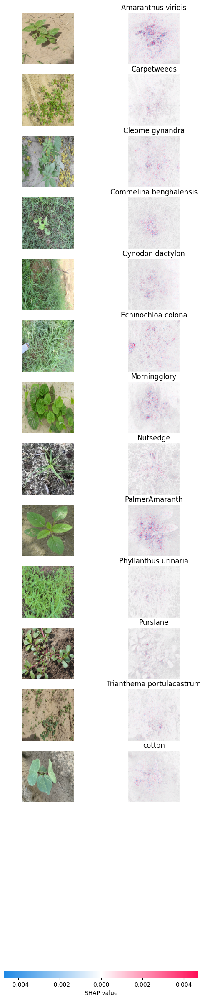


Generating test predictions for statistical tests...

McNemar's Test (InceptionResNetV2 Base vs InceptionResNetV2+Mamba)
Contingency table [[both_correct, base_only], [mamba_only, both_wrong]]:
    Both correct     : 1236
    Base only correct: 11
    Mamba only correct: 30
    Both wrong       : 23
Statistic : 7.9024
p-value   : 0.004937
=> Significant difference between models (p < 0.05)

Wilcoxon Signed-Rank Test (per-class F1: InceptionResNetV2 Base vs Mamba)
Per-class F1 (Base) : [0.9238 0.9703 0.9746 0.9754 0.9167 0.8932 0.97   0.9608 0.9588 1.
 0.9641 0.9694 0.995 ]
Per-class F1 (Mamba): [0.9652 0.9652 0.9849 0.995  0.95   0.9163 0.995  0.9652 0.9751 0.995
 0.9796 0.9798 0.995 ]
Statistic : 5.0000
p-value   : 0.004883
=> Significant difference in per-class F1 scores.

FINAL RESULTS - INCEPTIONRESNETV2 COTTON DATASET
InceptionResNetV2 Base Accuracy    : 95.92%
InceptionResNetV2 + Mamba Accuracy : 97.38%

Base Model saved at:
/content/drive/MyDrive/InceptionResNetV2_Cotton.keras


In [7]:
import os
import shutil
import pathlib
import numpy as np
import tensorflow as tf
import keras
from tensorflow.keras import layers
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input
from sklearn.metrics import (
    classification_report,
    precision_recall_fscore_support,
    accuracy_score
)
from statsmodels.stats.contingency_tables import mcnemar
from scipy.stats import wilcoxon

# ============================================================
# 1. CONFIGURATION & INCEPTIONRESNETV2 PATHS
# ============================================================

IMG_SIZE = 299  # InceptionResNetV2 standard input size
BATCH_SIZE = 32
SEED = 42

DRIVE_DATA_PATH = '/content/drive/MyDrive/cotton_weed_merged'
LOCAL_DATA_PATH = '/content/cotton_weed_local'

BASE_SAVE_PATH = '/content/drive/MyDrive/InceptionResNetV2_Cotton.keras'
MAMBA_SAVE_PATH = '/content/drive/MyDrive/Model/InceptionResNetV2_Cotton_Mamba.keras'

# ============================================================
# 2. CUSTOM LAYER REGISTRATION
# ============================================================

@keras.saving.register_keras_serializable(package="custom", name="LayerScale")
class LayerScale(layers.Layer):
    def __init__(self, channels, init_value=1e-2, **kwargs):
        super().__init__(**kwargs)
        self.channels = channels
        self.init_value = init_value

    def build(self, input_shape):
        self.gamma = self.add_weight(
            shape=(self.channels,),
            initializer=tf.keras.initializers.Constant(self.init_value),
            trainable=True,
            name="gamma"
        )

    def call(self, inputs):
        return inputs * self.gamma

    def get_config(self):
        config = super().get_config()
        config.update({
            "channels": self.channels,
            "init_value": self.init_value
        })
        return config


# ============================================================
# 3. MODEL LOADING (INCEPTIONRESNETV2 BASE & MAMBA)
# ============================================================

print("Loading InceptionResNetV2 saved models...")

def load_keras_model(path, custom_objects=None):
    if not os.path.exists(path):
        raise FileNotFoundError(f"Model file not found at: {path}")
    return tf.keras.models.load_model(
        path,
        custom_objects=custom_objects,
        compile=False,
        safe_mode=False
    )

model_base = load_keras_model(BASE_SAVE_PATH)
model_mamba = load_keras_model(
    MAMBA_SAVE_PATH,
    custom_objects={'LayerScale': LayerScale}
)

model_base_fp32 = model_base
model_mamba_fp32 = model_mamba


# ============================================================
# 4. RESTORE DATASET & DATASET PIPELINE
# ============================================================

if not os.path.exists(LOCAL_DATA_PATH):
    print("Copying cotton dataset to local Colab storage...")
    if os.path.exists(DRIVE_DATA_PATH):
        shutil.copytree(DRIVE_DATA_PATH, LOCAL_DATA_PATH)
        print("Cotton dataset copied successfully.")
    else:
        raise FileNotFoundError(f"Drive dataset path not found: {DRIVE_DATA_PATH}")
else:
    print("Local cotton dataset already exists.")

IMG_EXTENSIONS = {'.jpg', '.jpeg', '.png', '.bmp', '.webp', '.tmp'}
data_dir = pathlib.Path(LOCAL_DATA_PATH)
class_names = sorted([d.name for d in data_dir.iterdir() if d.is_dir()])
num_classes = len(class_names)

train_files, val_files, test_files = [], [], []
train_labels, val_labels, test_labels = [], [], []
rng = np.random.default_rng(SEED)

for idx, cls in enumerate(class_names):
    cls_dir = data_dir / cls
    files = sorted([str(p) for p in cls_dir.iterdir() if p.suffix.lower() in IMG_EXTENSIONS])
    files = np.array(files)
    rng.shuffle(files)

    n = len(files)
    n_train = int(n * 0.70)
    n_val = int(n * 0.10)

    train_files.extend(files[:n_train]);                train_labels.extend([idx] * n_train)
    val_files.extend(files[n_train:n_train + n_val]);     val_labels.extend([idx] * n_val)
    test_files.extend(files[n_train + n_val:]);           test_labels.extend([idx] * (n - n_train - n_val))

def load_and_preprocess(path, label):
    img = tf.io.read_file(path)
    img = tf.image.decode_image(img, channels=3, expand_animations=False)
    img = tf.image.resize(img, (IMG_SIZE, IMG_SIZE))
    img = preprocess_input(img)
    img.set_shape((IMG_SIZE, IMG_SIZE, 3))
    return img, label

def make_dataset(files, labels, training=False):
    ds = tf.data.Dataset.from_tensor_slices((files, labels))
    if training:
        ds = ds.shuffle(buffer_size=len(files), seed=SEED)
    ds = ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    return ds

train_ds = make_dataset(train_files, train_labels, training=True)
test_ds = make_dataset(test_files, test_labels)


# ============================================================
# 5. MODEL INPUT / OUTPUT SHAPES & PARAMETER COUNTS
# ============================================================

print("\n" + "=" * 50)
print("MODEL INPUT & OUTPUT SHAPES")
print("=" * 50)
print(f"Base Model Input Shape  : {model_base.input_shape}")
print(f"Base Model Output Shape : {model_base.output_shape}")
print(f"Mamba Model Input Shape  : {model_mamba.input_shape}")
print(f"Mamba Model Output Shape : {model_mamba.output_shape}")

print("\n" + "=" * 50)
print("PARAMETER COUNTS")
print("=" * 50)
print(f"InceptionResNetV2 Base Parameters       : {model_base.count_params():,}")
print(f"InceptionResNetV2+Mamba Parameters : {model_mamba.count_params():,}")


# ============================================================
# 6. SHAP EXPLAINABILITY
# ============================================================

get_ipython().system('pip install shap -q')
import shap

background = []
for images, _ in train_ds.take(2):
    background.append(images.numpy())
background = np.vstack(background)[:20].astype(np.float32)

class_samples = {}
for images, labels in test_ds:
    for i in range(len(labels)):
        class_id = int(labels[i].numpy())
        if class_id not in class_samples:
            class_samples[class_id] = images[i].numpy()
    if len(class_samples) == num_classes:
        break

test_images_shap = np.stack(
    [class_samples[i] for i in sorted(class_samples)]
).astype(np.float32)

print("\nCalculating SHAP values...")

shap_values = None
try:
    explainer_shap = shap.GradientExplainer(model_mamba_fp32, background)
    shap_values = explainer_shap.shap_values(test_images_shap)
except Exception as e:
    print(f"[SHAP] GradientExplainer failed ({e}); trying generic Explainer fallback...")
    try:
        explainer_shap = shap.Explainer(model_mamba_fp32, background)
        shap_values = explainer_shap(test_images_shap).values
    except Exception as e2:
        print(f"[SHAP] Fallback also failed: {e2}")
        shap_values = None

if shap_values is not None:
    if isinstance(shap_values, list):
        shap_values = [np.array(x) for x in shap_values]
    else:
        shap_values = np.array(shap_values)
        if shap_values.ndim == 5:
            shap_values = [shap_values[..., i] for i in range(shap_values.shape[-1])]
        else:
            shap_values = [shap_values]

    try:
        ordered_class_ids = sorted(class_samples)
        pred_labels = [class_names[c] for c in ordered_class_ids]

        single_class_shap = np.stack([
            shap_values[class_id][idx]
            for idx, class_id in enumerate(ordered_class_ids)
        ])

        # Rescale normalized images back for display
        display_imgs = (test_images_shap - test_images_shap.min()) / (test_images_shap.max() - test_images_shap.min() + 1e-7)

        shap.image_plot(
            [single_class_shap],
            display_imgs,
            labels=np.array([pred_labels]),
            show=True
        )
    except Exception as e:
        print(f"[SHAP] Plotting failed: {e}.")
else:
    print("[SHAP] No SHAP values could be computed — skipping visualization.")


# ============================================================
# 7. GENERATE PREDICTIONS FOR STATISTICAL TESTS
# ============================================================

print("\nGenerating test predictions for statistical tests...")
y_true = []
y_pred_base_list = []
y_pred_mamba_list = []

for images, labels in test_ds:
    y_true.extend(labels.numpy())
    preds_b = model_base(images, training=False).numpy()
    preds_m = model_mamba(images, training=False).numpy()
    y_pred_base_list.extend(np.argmax(preds_b, axis=1))
    y_pred_mamba_list.extend(np.argmax(preds_m, axis=1))

y_true = np.array(y_true)
y_pred_base = np.array(y_pred_base_list)
y_pred_mamba = np.array(y_pred_mamba_list)


# ============================================================
# 8. McNEMAR'S TEST
# ============================================================

correct_base = (y_pred_base == y_true)
correct_mamba = (y_pred_mamba == y_true)

a = np.sum(correct_base & correct_mamba)
b = np.sum(correct_base & ~correct_mamba)
c = np.sum(~correct_base & correct_mamba)
d = np.sum(~correct_base & ~correct_mamba)

table = [[a, b], [c, d]]

result = mcnemar(table, exact=(b + c < 25), correction=True)

print("\n" + "=" * 60)
print("McNemar's Test (InceptionResNetV2 Base vs InceptionResNetV2+Mamba)")
print("=" * 60)
print("Contingency table [[both_correct, base_only], [mamba_only, both_wrong]]:")
print(f"    Both correct     : {a}")
print(f"    Base only correct: {b}")
print(f"    Mamba only correct: {c}")
print(f"    Both wrong       : {d}")
print(f"Statistic : {result.statistic:.4f}")
print(f"p-value   : {result.pvalue:.6f}")

if result.pvalue < 0.05:
    print("=> Significant difference between models (p < 0.05)")
else:
    print("=> No significant difference between models (p >= 0.05)")


# ============================================================
# 9. WILCOXON TEST ON PER-CLASS F1 SCORES
# ============================================================

_, _, f1_base, _ = precision_recall_fscore_support(
    y_true, y_pred_base, labels=range(num_classes), zero_division=0
)
_, _, f1_mamba, _ = precision_recall_fscore_support(
    y_true, y_pred_mamba, labels=range(num_classes), zero_division=0
)

print("\n" + "=" * 60)
print("Wilcoxon Signed-Rank Test (per-class F1: InceptionResNetV2 Base vs Mamba)")
print("=" * 60)
print("Per-class F1 (Base) :", np.round(f1_base, 4))
print("Per-class F1 (Mamba):", np.round(f1_mamba, 4))

try:
    statistic, p_value = wilcoxon(f1_base, f1_mamba)
    print(f"Statistic : {statistic:.4f}")
    print(f"p-value   : {p_value:.6f}")
    if p_value < 0.05:
        print("=> Significant difference in per-class F1 scores.")
    else:
        print("=> No significant difference in per-class F1 scores.")
except Exception as e:
    print(f"Wilcoxon test could not be calculated: {e}")


# ============================================================
# 10. FINAL RESULTS
# ============================================================

print("\n" + "=" * 70)
print("FINAL RESULTS - INCEPTIONRESNETV2 COTTON DATASET")
print("=" * 70)
print(f"InceptionResNetV2 Base Accuracy    : {accuracy_score(y_true, y_pred_base) * 100:.2f}%")
print(f"InceptionResNetV2 + Mamba Accuracy : {accuracy_score(y_true, y_pred_mamba) * 100:.2f}%")
print(f"\nBase Model saved at:\n{BASE_SAVE_PATH}")
print(f"\nMamba Model saved at:\n{MAMBA_SAVE_PATH}")
